In [1]:
import numpy as np
import scipy
import cv2
import skimage as ski
import matplotlib.pyplot as plt
import scipy.signal

# Part 1 Fun with filters

## 1.1 Finite difference operator

Lets see how our image array looks like, because for png we often have 4 channels, so we have an RGB and also alpha channel:


In [2]:
camman_img = ski.io.imread('data/cameraman.png')
print(camman_img[250][250])
# biigg figurreess:
plt.rcParams['figure.figsize'] = (8.0, 8.0)

[ 10  10  10 255]


So we have an 4th channel that is always 255, we can just use cv2.imread to ignore the last channel. But then also the image is grey anyways so we can just take one channel since its always the same value r g and b, e.g. [ 10  10  10 255]

Lets also add the finite difference operator

(1, 2)
(2, 1)


libpng warning: iCCP: profile 'icc': 0h: PCS illuminant is not D50


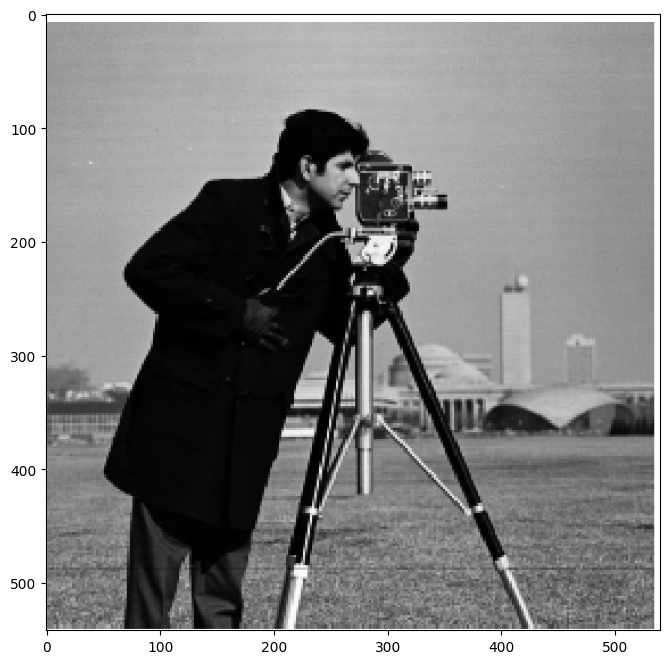

In [3]:
# Finite difference operator
D_x = np.array([[1, -1]])
D_y = np.array([[1], [-1]])
print(D_x.shape)
print(D_y.shape)

# Importing our image
camman_img = cv2.imread('data/cameraman.png')[:, :, 0] # A grayscale image as explained above
plt.imshow(camman_img, cmap='gray')

That was our original image
Now lets show the convoluted image:

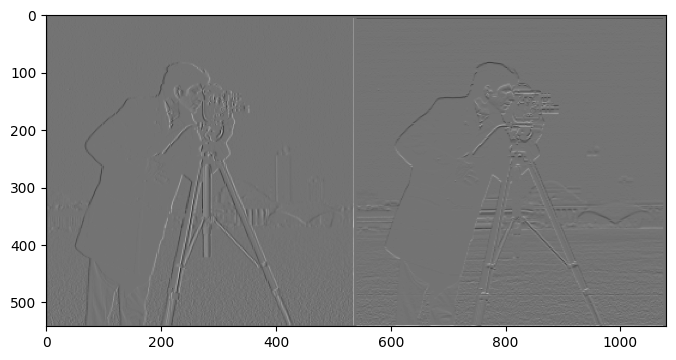

In [4]:
convoluted_dx = scipy.signal.convolve2d(camman_img, D_x, mode='same')
convoluted_dy = scipy.signal.convolve2d(camman_img, D_y, mode='same')
hstacked = np.concatenate((convoluted_dx, convoluted_dy), axis=1)
plt.imshow(hstacked, cmap='gray')
plt.imsave('output/convoluted_dx.png', convoluted_dx, cmap='gray')
plt.imsave('output/convoluted_dy.png', convoluted_dy, cmap='gray')

On the left side we have the convoluted image with the D_x kernel, which are basically all the vertical edges
On the right side we have the convoluted image with the D_y kernel, which are basically all the horizontal edges

Lets create our gradient magnitude image first.

After that we can threshold it to make the edges more visible:

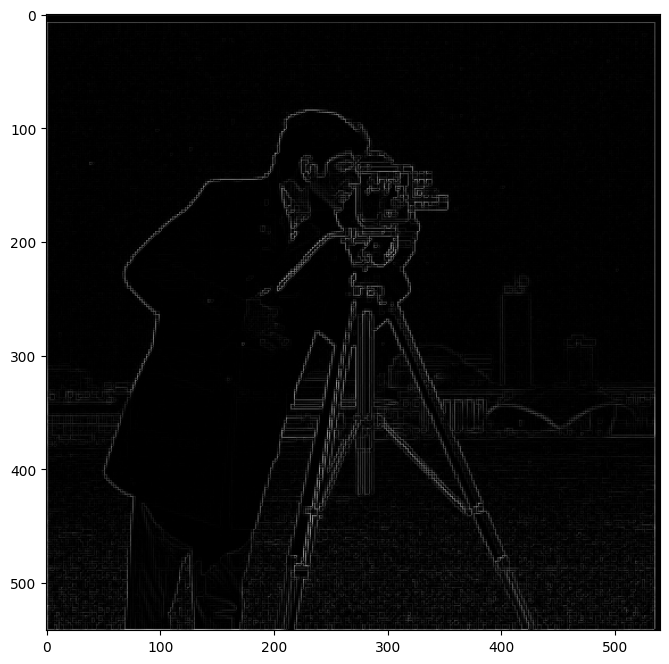

In [5]:
# Gradient magnitude
# This is how we calculate the gradient magnitude, which is also called the edge strenth
grad_mag = np.sqrt(convoluted_dx**2 + convoluted_dy**2)
plt.imshow(grad_mag, cmap='gray')
plt.imsave('output/grad_mag.png', grad_mag, cmap='gray')

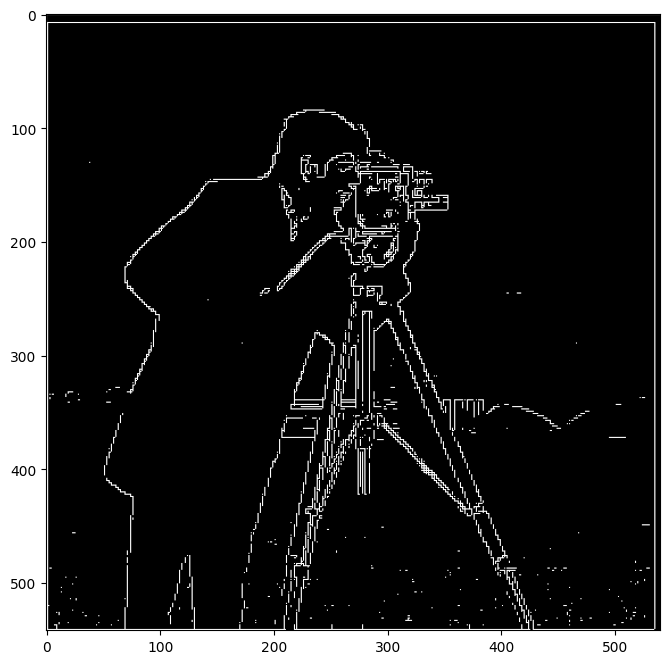

In [6]:
# Non edges to black (under threshold)
# Found out threshhold through trying out different values
threshold = 60
grad_mag_thresh = grad_mag.copy()
grad_mag_thresh[grad_mag < threshold] = 0

# Edges to white
grad_mag_thresh[grad_mag >= threshold] = 255
plt.imshow(grad_mag_thresh, cmap='gray')
plt.imsave('output/grad_mag_thresh.png', grad_mag_thresh, cmap='gray')


## 1.2 Derivative of Gaussian Filter (Dog filter)

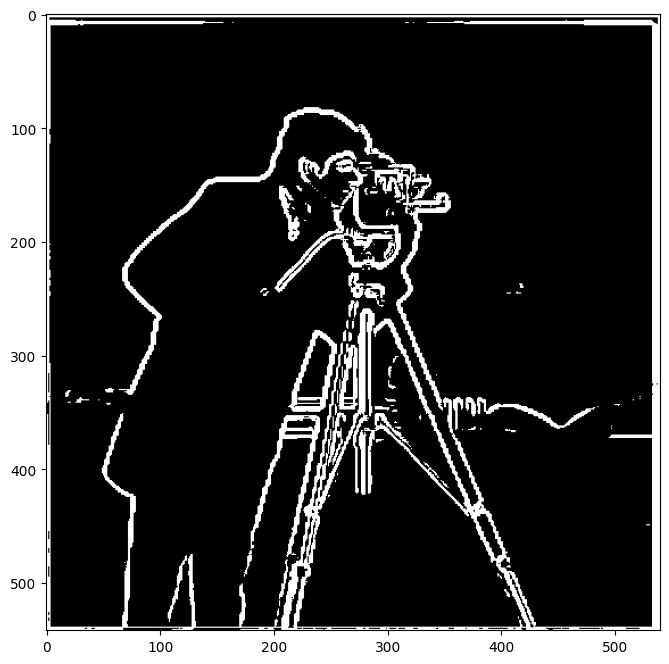

In [7]:
gaussian_kernel = cv2.getGaussianKernel(5,3).T * cv2.getGaussianKernel(5,3)
# Now we have a kernel and lets convolut our image with it to make it blurry
blurry_image = scipy.signal.convolve2d(camman_img, gaussian_kernel, mode='same')
# We do the same convolution as above
convoluted_dx = scipy.signal.convolve2d(blurry_image, D_x, mode='same')
convoluted_dy = scipy.signal.convolve2d(blurry_image, D_y, mode='same')
# Gradient magnitude
grad_mag = np.sqrt(convoluted_dx**2 + convoluted_dy**2)
# Do the same threshholding as above
threshold = 17
grad_mag_thresh = grad_mag.copy()
grad_mag_thresh[grad_mag < threshold] = 0
# Edges to white
grad_mag_thresh[grad_mag >= threshold] = 255
plt.imshow(grad_mag_thresh, cmap='gray')
plt.imsave('output/grad_mag_thresh_blurred.png', grad_mag_thresh, cmap='gray')


<span style="color:red">What differences do you see?</span>
Okay this result is already pretty good. This is because we got rid of the noise that was in the grass and in some other parts of the image, that was caused by some pixels having a very different intensity then its surrounding pixels. this has now been cancelled out by blurrying the image a little. 


We can simplify things by using just one convolution instead of two by making a derivative of Gaussian filters. We just convolve the Gaussian with D_x and D_y.
<span style="color:red">Verify that you get the same result as before!</span>
We get the same results from before as we can see on the next image.


What was very important here is that for creating the dog filter kernel, we used the mode full, so that no information is lost. Full adds 0 padding, which means, that with our gaussian kernel of size 5x5, if we apply the 1x2 D_x kernel on it for convolution, we will pad it on the left and right side with 0 each, so that it results in a 5x7. After that we apply the convolution with the D_x kernel, so that it will end up as a 5x6 dx DoG Kernel. Same with D_y

[[0.0317564  0.03751576 0.03965895 0.03751576 0.0317564 ]
 [0.03751576 0.04431963 0.04685151 0.04431963 0.03751576]
 [0.03965895 0.04685151 0.04952803 0.04685151 0.03965895]
 [0.03751576 0.04431963 0.04685151 0.04431963 0.03751576]
 [0.0317564  0.03751576 0.03965895 0.03751576 0.0317564 ]]
[[ 0.0317564   0.00575935  0.00214319 -0.00214319 -0.00575935 -0.0317564 ]
 [ 0.03751576  0.00680387  0.00253188 -0.00253188 -0.00680387 -0.03751576]
 [ 0.03965895  0.00719256  0.00267652 -0.00267652 -0.00719256 -0.03965895]
 [ 0.03751576  0.00680387  0.00253188 -0.00253188 -0.00680387 -0.03751576]
 [ 0.0317564   0.00575935  0.00214319 -0.00214319 -0.00575935 -0.0317564 ]]


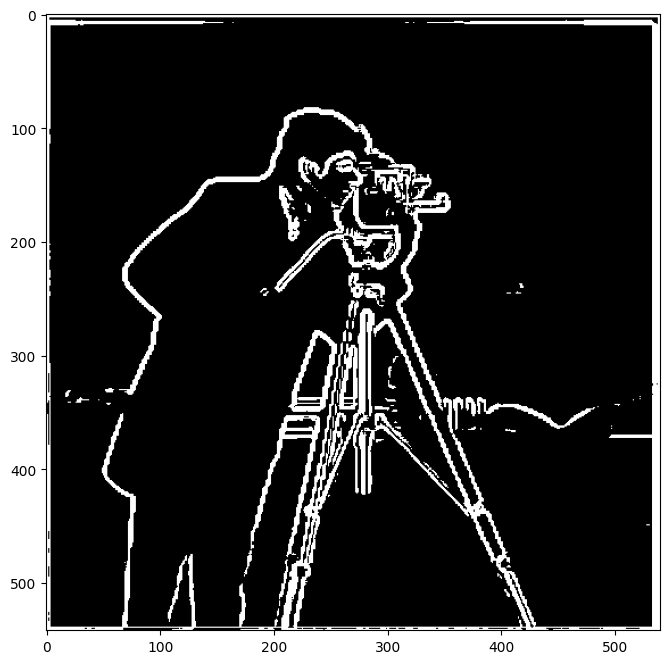

In [8]:
# We use the same gaussian kernel but now create a dog filter, by convolving the gaussian with D_x and D_y
print(gaussian_kernel)
dog_filter_dx = scipy.signal.convolve2d(gaussian_kernel, D_x, mode='full')
print(dog_filter_dx)

dog_filter_dy = scipy.signal.convolve2d(gaussian_kernel, D_y, mode='full')
dog_filter_result_dx = scipy.signal.convolve2d(camman_img, dog_filter_dx, mode='same')
dog_filter_result_dy = scipy.signal.convolve2d(camman_img, dog_filter_dy, mode='same')
dog_filter_grad_mag = np.sqrt(dog_filter_result_dx**2 + dog_filter_result_dy**2)
# plt.imshow(dog_filter_grad_mag, cmap='gray')
# Do the same threshholding as above
threshold = 17
dog_filter_result_thresh = dog_filter_grad_mag.copy()
dog_filter_result_thresh[dog_filter_grad_mag < threshold] = 0
# Edges to white
dog_filter_result_thresh[dog_filter_grad_mag >= threshold] = 255
plt.imshow(dog_filter_result_thresh, cmap='gray')
plt.imsave('output/dog_filter_result_thresh.png', dog_filter_result_thresh, cmap='gray')


# 2. Fun with Frequencies!
## 2.1 Image "Sharpening"

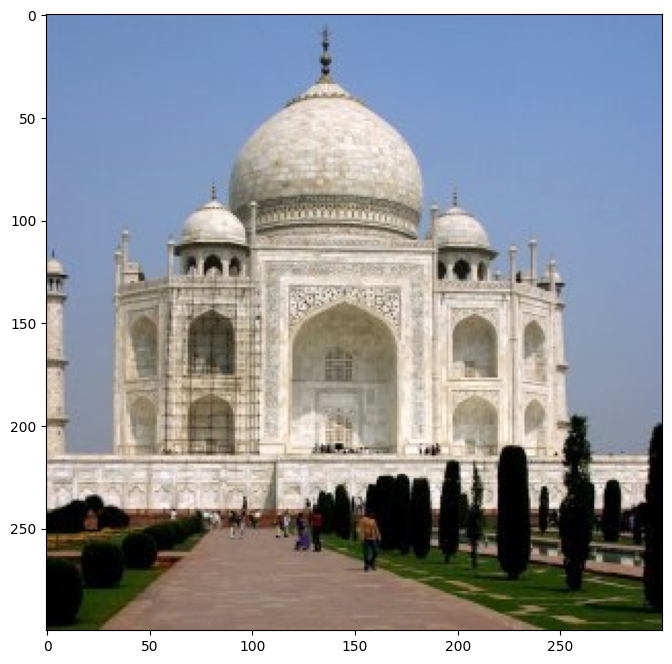

In [9]:
# Importing our image
taj = cv2.imread('data/taj.jpg')
# OpenCV reads the image in BGR format, we convert it to RGB format for mathplotlib
# Also, we need to normalize the image to be in the range [0, 1]
taj = cv2.cvtColor(taj, cv2.COLOR_BGR2RGB)/255.0
plt.imshow(taj)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.191468344524151..1.9738558566393145].


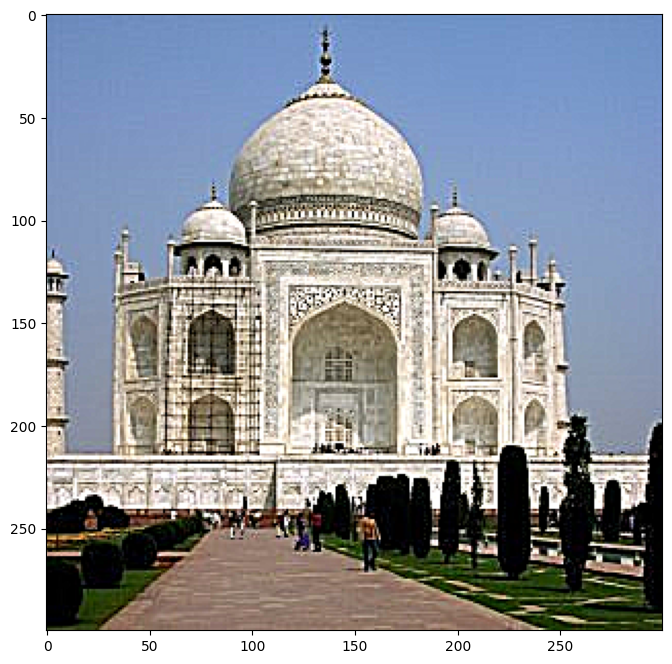

In [10]:
def convolve_channels(image, kernel):
    new_image = np.zeros_like(image)
    for i in range(image.shape[2]):
        new_image[:,:,i] = scipy.signal.convolve2d(image[:,:,i], kernel, mode='same', boundary='symm')
        # We could use this instead of scipy.signal.convolve2d, as it is faster, but its behaves a little differently:
        # new_image[:,:,i] = cv2.filter2D(image[:,:,i], ddepth=-1, kernel=kernel)
    return new_image
def normalized_image(final):
    return (final-final.min())/(final.max()-final.min())

# Now lets make it blurry
gaussian_kernel = cv2.getGaussianKernel(5,3).T * cv2.getGaussianKernel(5,3)
# Now we have a kernel and lets convolut our image with it to make it blurry
blurry_image = convolve_channels(taj, gaussian_kernel)

high_frequency = taj - blurry_image
alpha = 2
sharp_image = taj + alpha * high_frequency
plt.imshow(sharp_image)

# Clip negative values and values above 1 that are caused by some numerical rounding errors
sharp_image[sharp_image < 0] = 0
sharp_image[sharp_image > 1] = 1
plt.imsave('output/sharp_image.png', sharp_image)
plt.imsave('output/high_frequency.png', normalized_image(high_frequency))




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.27700012245868455..1.2434639641598286].


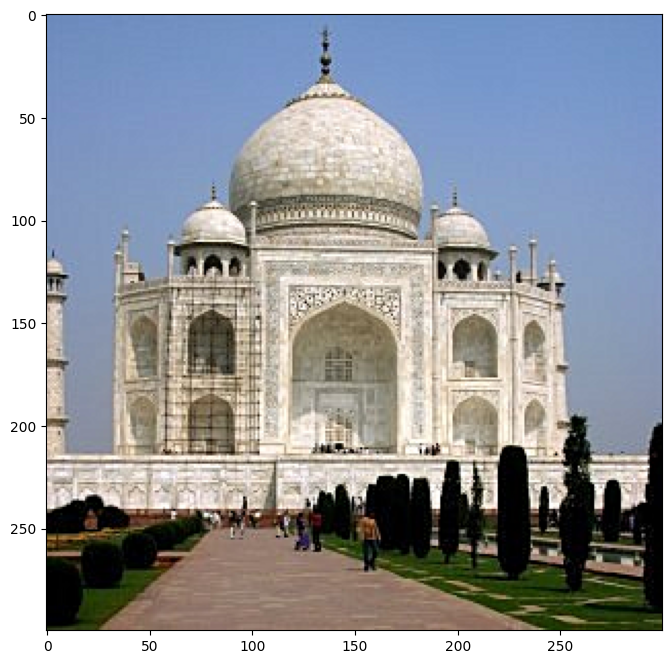

In [11]:
alpha = 0.5
sharp_image = taj + alpha * high_frequency
plt.imshow(sharp_image)

sharp_image[sharp_image < 0] = 0
sharp_image[sharp_image > 1] = 1
plt.imsave('output/taj_sharpened_05.png', sharp_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5741655448110952..1.4869279283196573].


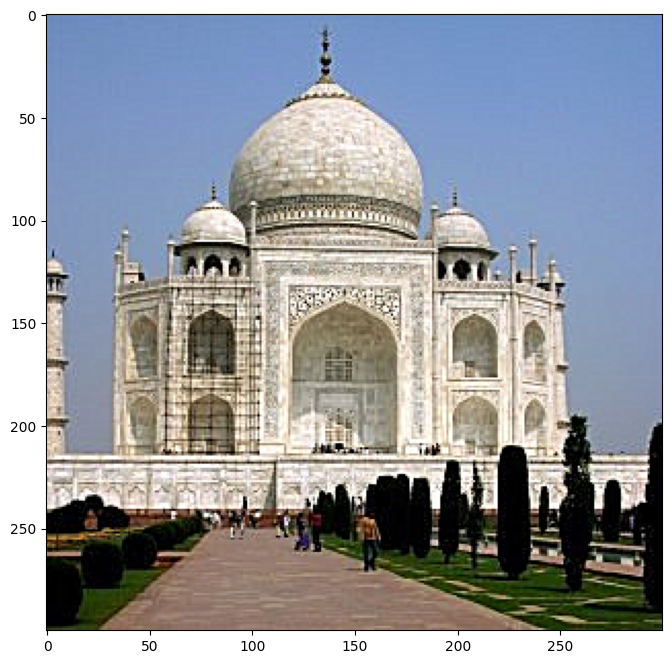

In [12]:
alpha = 1
sharp_image = taj + alpha * high_frequency
plt.imshow(sharp_image)

sharp_image[sharp_image < 0] = 0
sharp_image[sharp_image > 1] = 1
plt.imsave('output/taj_sharpened_1.png', sharp_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.426073943950263..2.947711713278629].


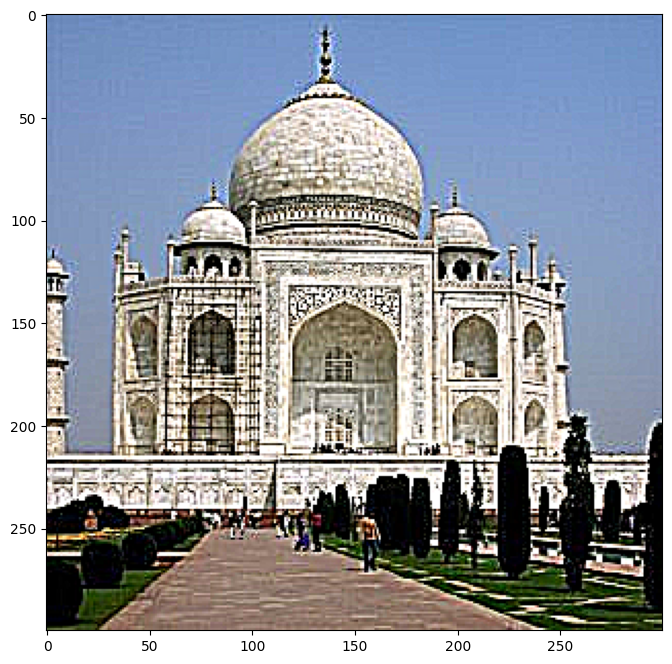

In [13]:
alpha = 4
sharp_image = taj + alpha * high_frequency
plt.imshow(sharp_image)

sharp_image[sharp_image < 0] = 0
sharp_image[sharp_image > 1] = 1
plt.imsave('output/taj_sharpened_4.png', sharp_image)

Lets try with an image of my choice

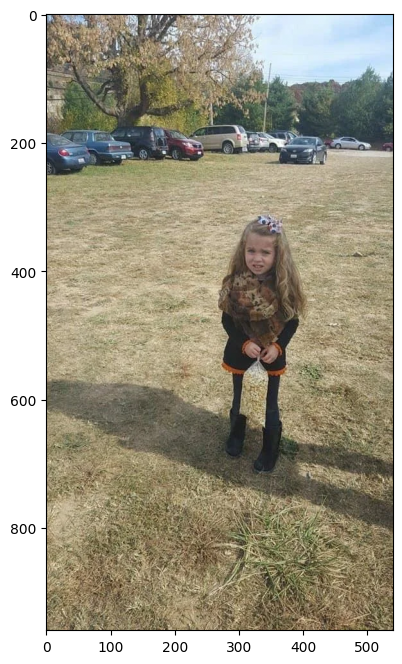

In [14]:
# Importing our image
popcorn = cv2.imread('data/popcorn.webp')
# OpenCV reads the image in BGR format, we convert it to RGB format for mathplotlib
# Also, we need to normalize the image to be in the range [0, 1]
popcorn = cv2.cvtColor(popcorn, cv2.COLOR_BGR2RGB)/255.0
plt.imshow(popcorn)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4422270606001408..2.42826975275225].


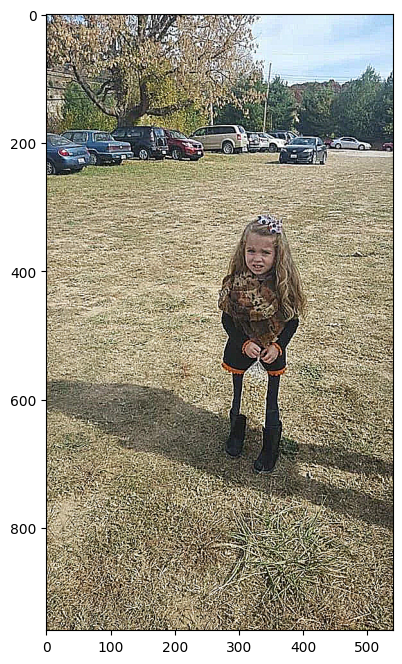

In [15]:
gaussian_kernel = cv2.getGaussianKernel(5,3).T * cv2.getGaussianKernel(5,3)
# Now we have a kernel and lets convolut our image with it to make it blurry
blurry_image = convolve_channels(popcorn, gaussian_kernel)

high_frequency = popcorn - blurry_image
alpha = 3
sharp_image = popcorn + alpha * high_frequency
plt.imshow(sharp_image)


sharp_image[sharp_image < 0] = 0
sharp_image[sharp_image > 1] = 1
plt.imsave('output/popcorn_sharpened.png', sharp_image)

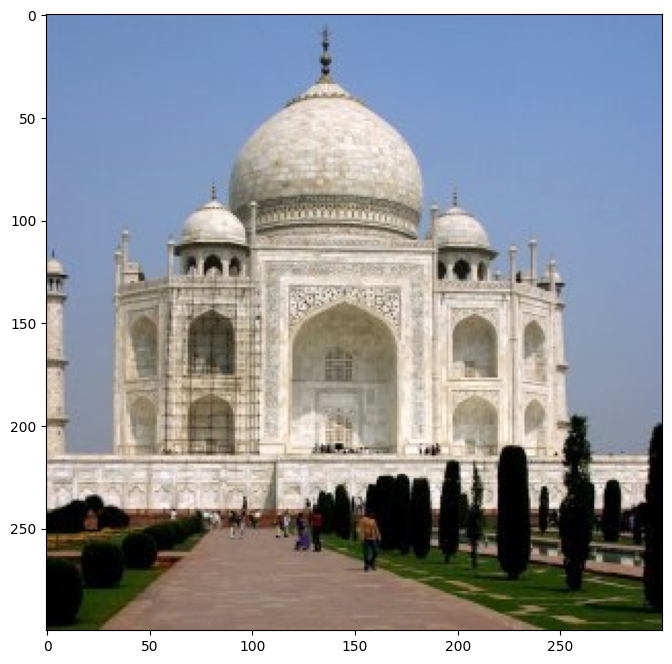

In [16]:
# Lets for evaluation unsharpen an image, sharpen it and then compare it to the original image
taj = cv2.imread('data/taj.jpg')
taj = cv2.cvtColor(taj, cv2.COLOR_BGR2RGB)/255.0
plt.imshow(taj)

# Original Image:

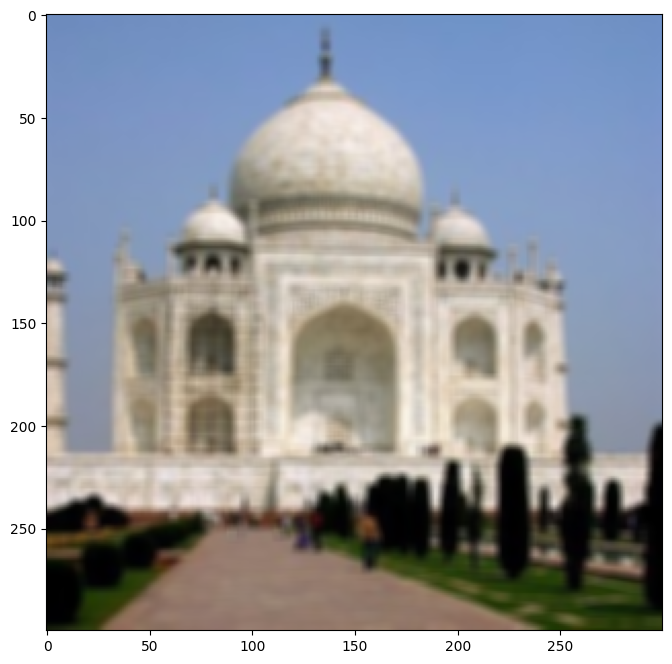

In [17]:
gaussian_kernel = cv2.getGaussianKernel(5,3).T * cv2.getGaussianKernel(5,3)
# Now we have a kernel and lets convolut our image with it to make it blurry
blurry_image_taj = convolve_channels(taj, gaussian_kernel)
plt.imshow(blurry_image_taj)
# Blurry "Original" image we are going to work with

plt.imsave('output/taj_blurry.png', blurry_image_taj)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.576765123239827..1.6699854115432178].


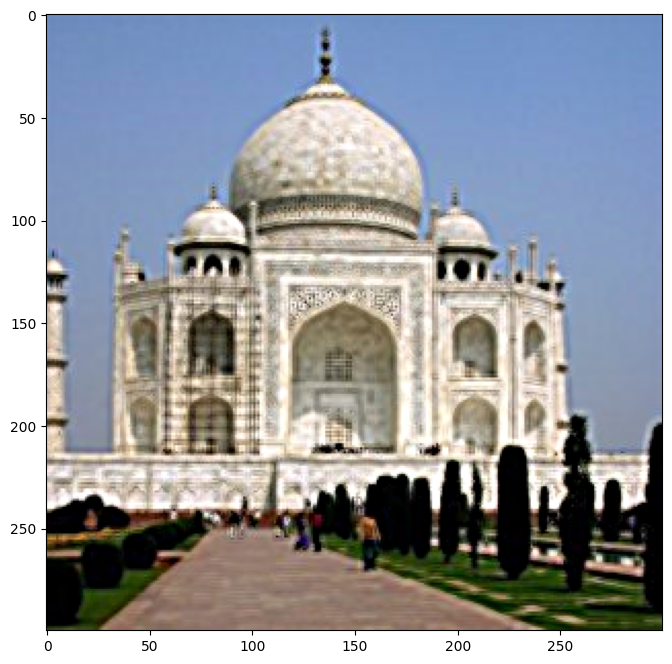

In [18]:
blurry_image_taj_lowfreqency = convolve_channels(blurry_image_taj, gaussian_kernel)
taj_high_frequency = blurry_image_taj - blurry_image_taj_lowfreqency
alpha = 4
sharp_image = taj + alpha * taj_high_frequency
plt.imshow(sharp_image)

# Sharpened Image:
sharp_image[sharp_image < 0] = 0
sharp_image[sharp_image > 1] = 1
plt.imsave('output/blurried_taj_sharpened.png', sharp_image)

## 2.2 Hybrid Images
Black White

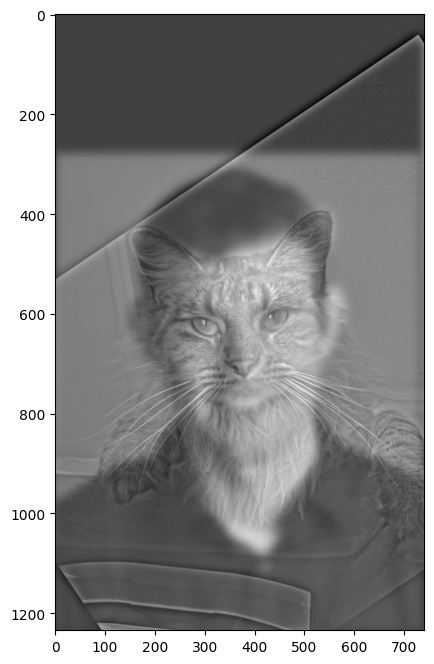

In [19]:
# Good thing that the image allign code was already provided, here we just import the aligned images
derek = cv2.imread('data/rotated_derek.jpg', cv2.IMREAD_GRAYSCALE)
nutmeg = cv2.imread('data/rotated_nutmeg.jpg', cv2.IMREAD_GRAYSCALE)


sigma = 9
# I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
kernelsize = sigma * 6 + 1
gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
blurry_image_tongue = scipy.signal.convolve2d(derek, gaussian_kernel, mode='same')

blurry_image_notongue = scipy.signal.convolve2d(nutmeg, gaussian_kernel, mode='same') 
high_frequency_notongue = nutmeg - blurry_image_notongue
final_image = (blurry_image_tongue + high_frequency_notongue) //2
plt.imshow(final_image, cmap='gray')
plt.imsave('output/derek_nutmeg.png', final_image, cmap='gray')
plt.imsave('output/derek_nutmeg_low.png', blurry_image_tongue, cmap='gray')
plt.imsave('output/derek_nutmeg_high.png', high_frequency_notongue, cmap='gray')

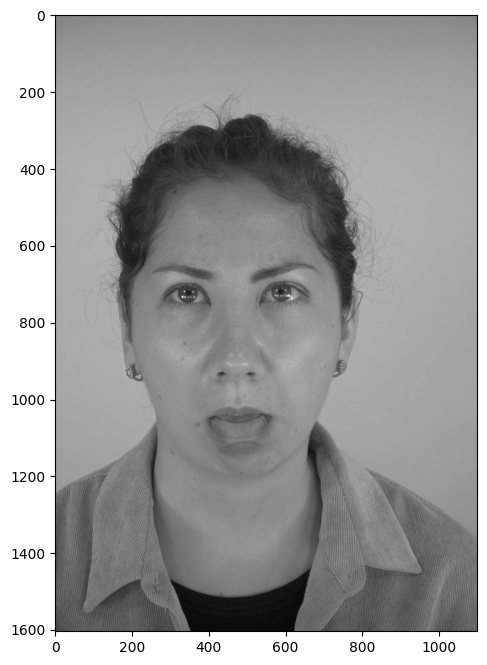

In [20]:
tongue = cv2.imread('data/tongue.jpg', cv2.IMREAD_GRAYSCALE)
notongue = cv2.imread('data/notongue.jpg', cv2.IMREAD_GRAYSCALE)

sigma = 6
# I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
kernelsize = sigma * 6 + 1
gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
blurry_image_tongue = scipy.signal.convolve2d(tongue, gaussian_kernel, mode='same')

blurry_image_notongue = scipy.signal.convolve2d(notongue, gaussian_kernel, mode='same') 
high_frequency_notongue = notongue - blurry_image_notongue
final_image = (blurry_image_tongue + high_frequency_notongue) //2
plt.imshow(final_image, cmap='gray')
plt.imsave('output/blurry_image_tongue.png', blurry_image_tongue, cmap='gray')
plt.imsave('output/high_frequency_notongue.png', high_frequency_notongue, cmap='gray')
plt.imsave('output/tongue_final.png', final_image, cmap='gray')

In [21]:
# Lets display the images using frequency analysis
# Here is the 2D fourier transform of the images
plt.imsave('output/fou_low_freq_tongue.png', np.log(np.abs(np.fft.fftshift(np.fft.fft2(blurry_image_tongue)))))
plt.imsave('output/fou_high_freq_notongue.png', np.log(np.abs(np.fft.fftshift(np.fft.fft2(high_frequency_notongue)))))
plt.imsave('output/fou_final_tongue.png', np.log(np.abs(np.fft.fftshift(np.fft.fft2(final_image)))))

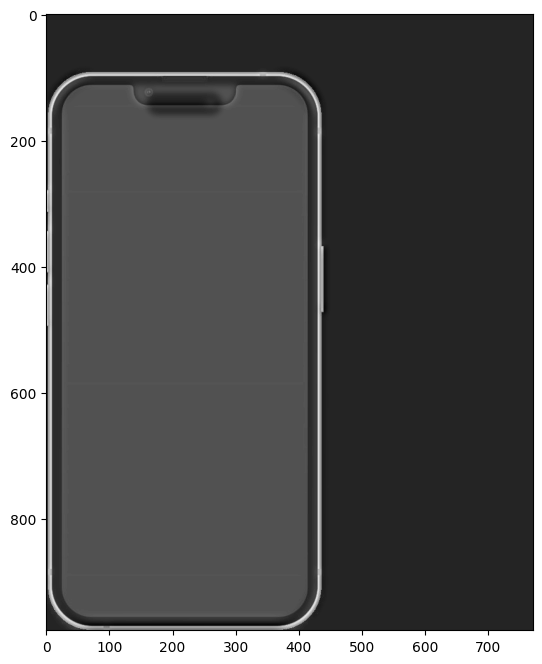

In [22]:
# Another try with a phone
derek = cv2.imread('data/ip14.jpg', cv2.IMREAD_GRAYSCALE)
nutmeg = cv2.imread('data/ip15.jpg', cv2.IMREAD_GRAYSCALE)

sigma = 5
# I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
kernelsize = sigma * 6 + 1
gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
blurry_image_derek = scipy.signal.convolve2d(derek, gaussian_kernel, mode='same')

blurry_image_nutmeg = scipy.signal.convolve2d(nutmeg, gaussian_kernel, mode='same') 
high_frequency_nutmeg = nutmeg - blurry_image_nutmeg
final_image = (blurry_image_derek + high_frequency_nutmeg) //2
plt.imshow(final_image, cmap='gray')
plt.imsave('output/blurry_image_iphone.png', blurry_image_nutmeg, cmap='gray')
plt.imsave('output/high_frequency_iphone.png', high_frequency_nutmeg, cmap='gray')
plt.imsave('output/iphone_final.png', final_image, cmap='gray')


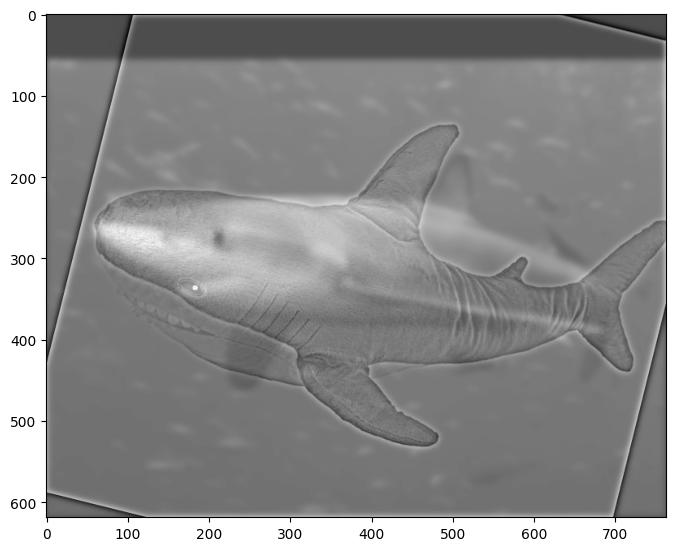

In [23]:
# Another try with a shark
derek = cv2.imread('data/shark.jpg', cv2.IMREAD_GRAYSCALE)
nutmeg = cv2.imread('data/sharky.jpg', cv2.IMREAD_GRAYSCALE)

sigma = 4
# I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
kernelsize = sigma * 6 + 1
gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
blurry_image_derek = scipy.signal.convolve2d(derek, gaussian_kernel, mode='same')

blurry_image_nutmeg = scipy.signal.convolve2d(nutmeg, gaussian_kernel, mode='same') 
high_frequency_nutmeg = nutmeg - blurry_image_nutmeg
final_image = (blurry_image_derek + high_frequency_nutmeg) // 2
plt.imshow(final_image, cmap='gray')

plt.imsave('output/shark_blurry_image.png', blurry_image_nutmeg, cmap='gray')
plt.imsave('output/shark_high_frequency.png', high_frequency_nutmeg, cmap='gray')
plt.imsave('output/shark_final.png', final_image, cmap='gray')


Color:

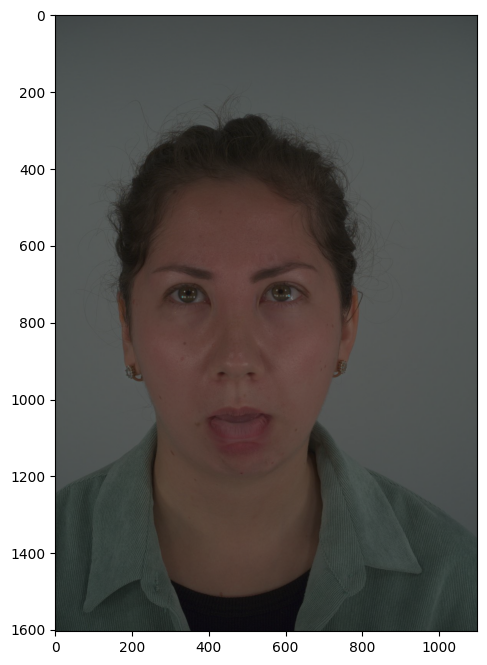

In [24]:
derek = cv2.imread('data/tongue.jpg')
nutmeg = cv2.imread('data/notongue.jpg')
derek = cv2.cvtColor(derek, cv2.COLOR_BGR2RGB)
nutmeg = cv2.cvtColor(nutmeg, cv2.COLOR_BGR2RGB)
sigma = 7
# I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
kernelsize = sigma * 6 + 1
gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
blurry_image_derek = convolve_channels(derek, gaussian_kernel)

blurry_image_nutmeg = convolve_channels(nutmeg, gaussian_kernel) 
high_frequency_nutmeg = nutmeg - blurry_image_nutmeg
final_image = (blurry_image_derek + high_frequency_nutmeg) //2
plt.imshow(final_image)
plt.imsave('output/tongue_color_final.png', final_image)


## 2.3 Gaussian and Laplacian Stacks

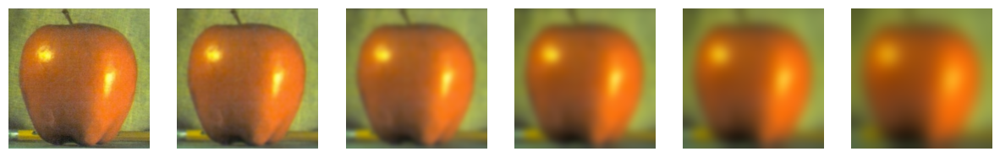

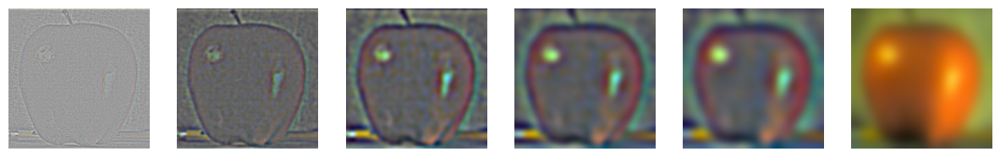

In [25]:
apple = cv2.imread('data/apple.jpeg')
apple = cv2.cvtColor(apple, cv2.COLOR_BGR2RGB)/ 255.0

def get_stacked_gau(img):
    stack_gau = []
    stack_gau.append(img)
    for i in range(5):
        # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
        sigma = (i + 1) * 2
        # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
        kernelsize = sigma * 6 + 1
        gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
        blurry_image = convolve_channels(stack_gau[i], gaussian_kernel)
        stack_gau.append(blurry_image)
    return stack_gau

def get_stacked_lap(stacked_gau):
    stack_lap = []
    for i in range(5):
        # Getting the high frequency part by subtracting the blurred image from the original image
        stack_lap.append(stacked_gau[i] - stacked_gau[i + 1])
    stack_lap.append(stacked_gau[i])
    return stack_lap

def show_images(image_stack):
    fig, axs = plt.subplots(1, len(image_stack), figsize=(15, 5)) 
    for i in range(len(image_stack)):
        axs[i].imshow(normalized_image(image_stack[i])) 
        axs[i].axis('off') 
    plt.show()    


apple_stack_gau = get_stacked_gau(apple)

show_images(apple_stack_gau)

# Lets do the Lapclacian Stack now
apple_stack_lap = get_stacked_lap(apple_stack_gau)

show_images(apple_stack_lap)


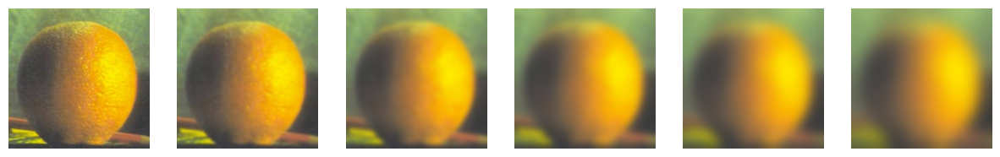

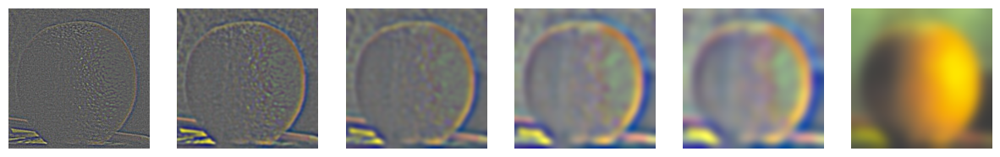

In [26]:
# Now we do the same for the orange
orange = cv2.imread('data/orange.jpeg')
orange = cv2.cvtColor(orange, cv2.COLOR_BGR2RGB)/ 255.0

orange_stack_gau = get_stacked_gau(orange)

show_images(orange_stack_gau)

# Lets do the Lapclacian Stack now
orange_stack_lap = get_stacked_lap(orange_stack_gau)

show_images(orange_stack_lap)


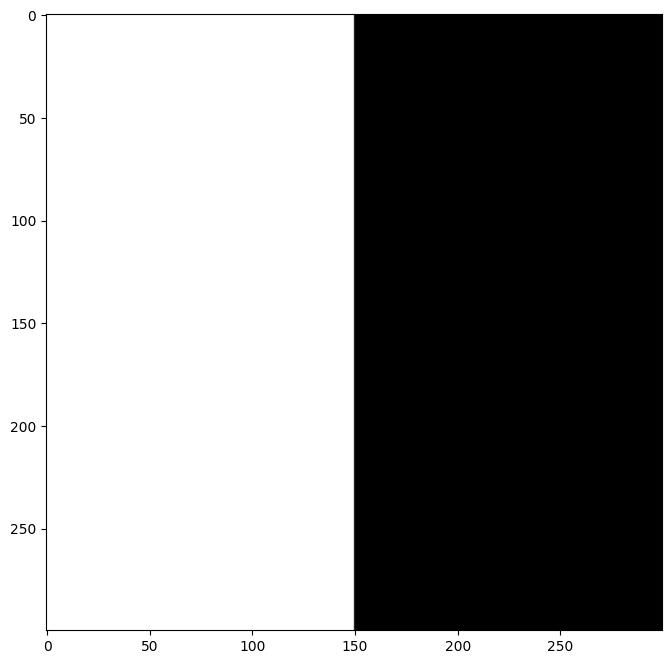

In [27]:
# Create a mask that is the same size as our image
half_mask = np.zeros(orange.shape[:-1], dtype=np.uint8)

# We want half of the matrix to be white
half_cols = orange.shape[1] // 2
half_mask[:, :half_cols] = 1

plt.imshow(half_mask, cmap='gray')


(300, 300, 3)
(300, 300, 3)
(300, 300, 3)
(300, 300, 3)
(300, 300, 3)
(300, 300, 3)


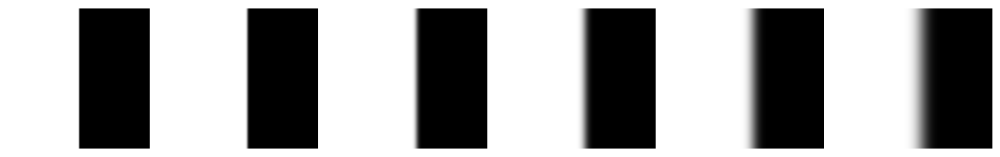

In [28]:
# Now we do the same for the mask
half_mask_stack_gau = []
half_mask_stack_gau.append(half_mask)


# We are doing 6 layers for our stack, so we need to do 5 more
for i in range(5):
    # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
    sigma = (i + 1) * 2
    # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
    kernelsize = sigma * 6 + 1
    gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
    # We need to choose symm for boundary here because else we get like a weird black border around the white part
    blurry_image_half_mask = scipy.signal.convolve2d(half_mask_stack_gau[i], gaussian_kernel, mode='same', boundary='symm')
    half_mask_stack_gau.append(blurry_image_half_mask)

# Show the images
fig, axs = plt.subplots(1, 6, figsize=(15, 5)) 
for i in range(6):
    axs[i].imshow(half_mask_stack_gau[i], cmap='gray') 
    axs[i].axis('off') 
    # A lazy hack so that I can just multiply the mask with the image later
    half_mask_stack_gau[i] = np.stack([half_mask_stack_gau[i]] * 3, axis=-1)
    print(half_mask_stack_gau[i].shape)

plt.show()


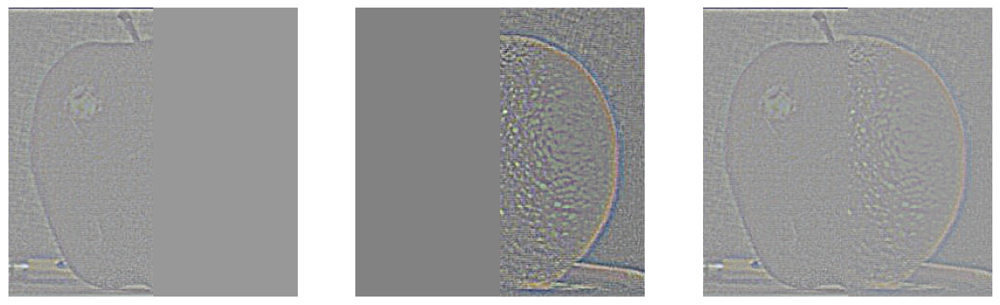

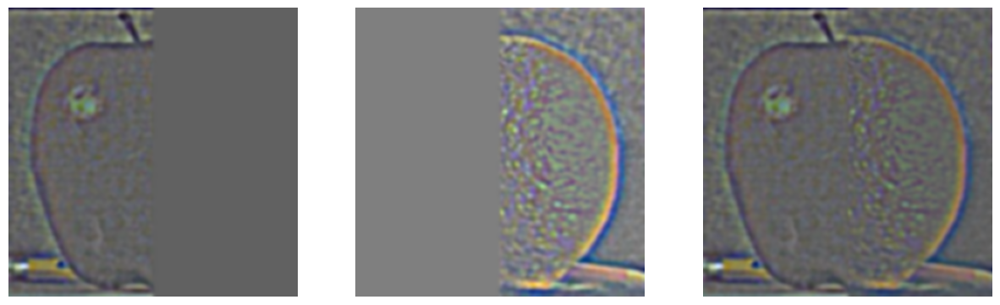

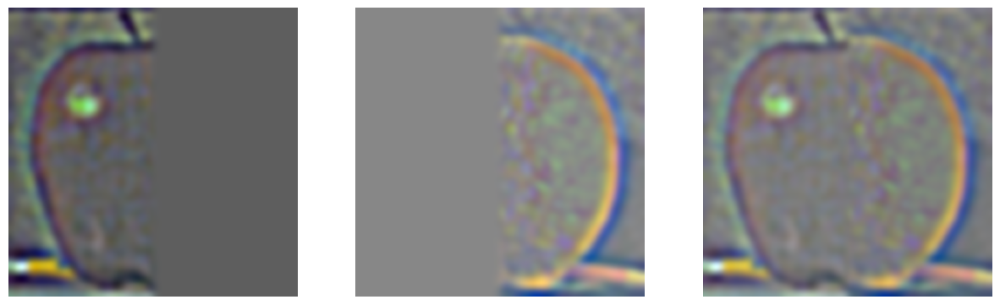

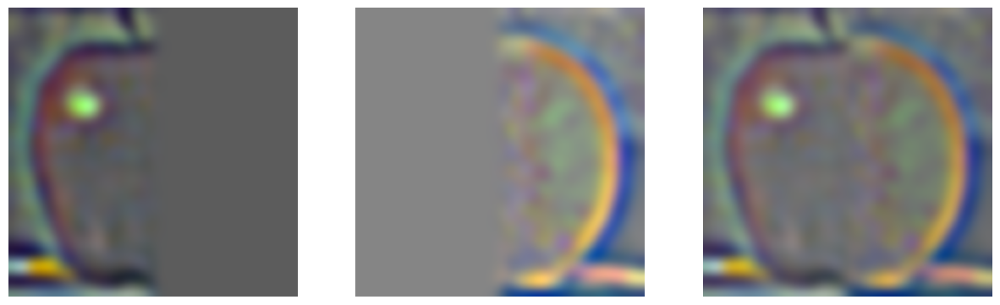

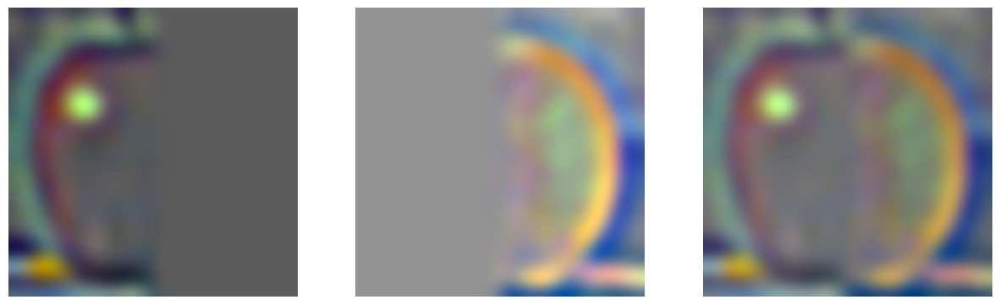

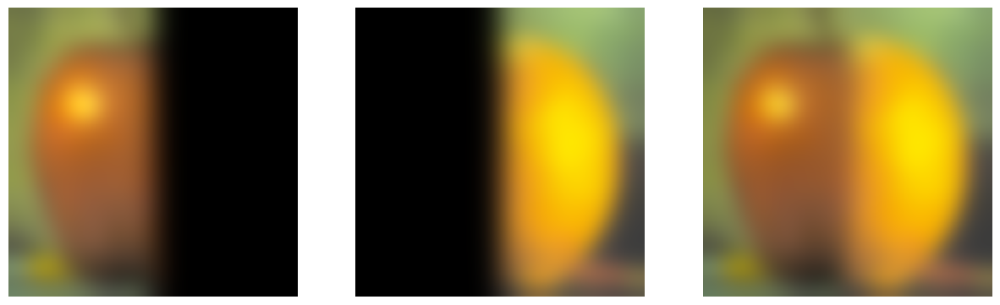

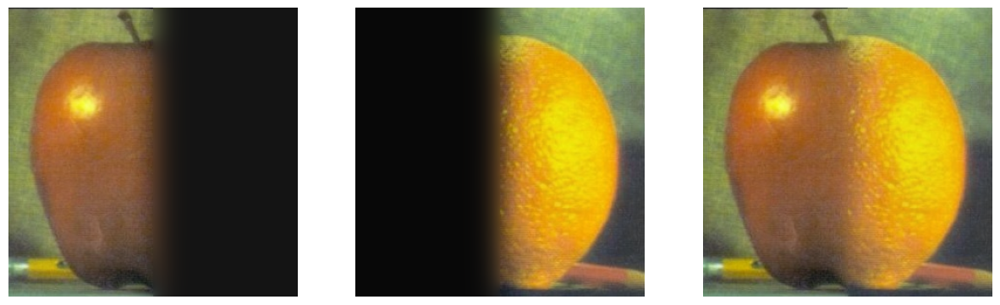

In [30]:
# Lets do it with with a lot of detail using the laplacian stack 
left_arr = []
right_arr = []
final_arr = []
for i in range(6):
    temp = []
    left = apple_stack_lap[i] * half_mask_stack_gau[i]
    right = orange_stack_lap[i] * (1 - half_mask_stack_gau[i])
    temp_final = left + right
    left_arr.append(left)
    right_arr.append(right)
    final_arr.append(temp_final)
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(normalized_image(left))
    axs[1].imshow(normalized_image(right))
    axs[2].imshow(normalized_image(temp_final))
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    plt.show()

final_left = 0
final_right = 0
final = 0

for i in range(6):
    final_left += left_arr[i]
    final_right += right_arr[i]
    final += final_arr[i]

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(normalized_image(final_left))
axs[1].imshow(normalized_image(final_right))
axs[2].imshow(normalized_image(final))
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')

plt.show()


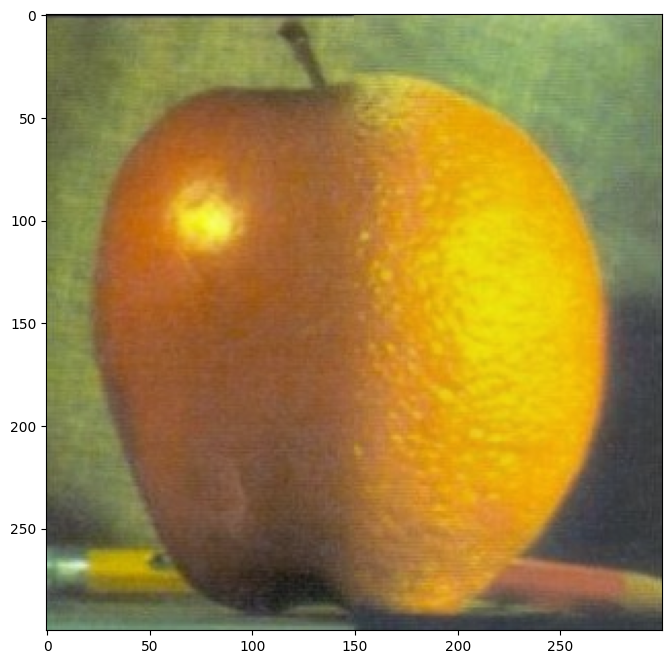

In [31]:
plt.imshow(normalized_image(final))

plt.imsave('final.jpg', normalized_image(final))

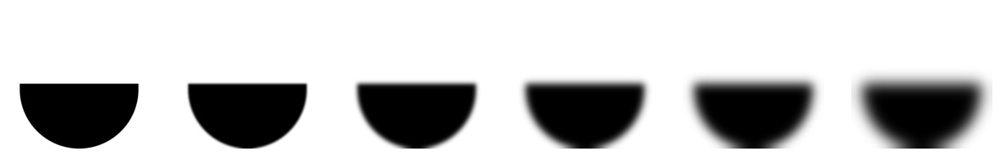

In [32]:
# Now we try it with our irregular mask that is a half circle
half_mask_round = cv2.imread('data/mask.png')[:, :, 0] / 255.0
round_half_mask_stack_gau = []
round_half_mask_stack_gau.append(half_mask_round)


# We are doing 6 layers for our stack, so we need to do 5 more
for i in range(5):
    # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
    sigma = (i + 1) * 2
    # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
    kernelsize = sigma * 6 + 1
    gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
    # We need to choose symm for boundary here because else we get like a weird black border around the white part
    blurry_image_half_mask = scipy.signal.convolve2d(round_half_mask_stack_gau[i], gaussian_kernel, mode='same', boundary='symm')
    round_half_mask_stack_gau.append(blurry_image_half_mask)

# Show the images
fig, axs = plt.subplots(1, 6, figsize=(15, 5)) 
for i in range(6):
    axs[i].imshow(round_half_mask_stack_gau[i], cmap='gray') 
    axs[i].axis('off') 
    # A lazy hack so that I can just multiply the mask with the image later
    round_half_mask_stack_gau[i] = np.stack([round_half_mask_stack_gau[i]] * 3, axis=-1)
plt.show()

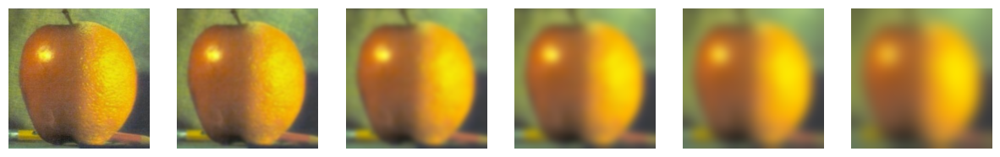

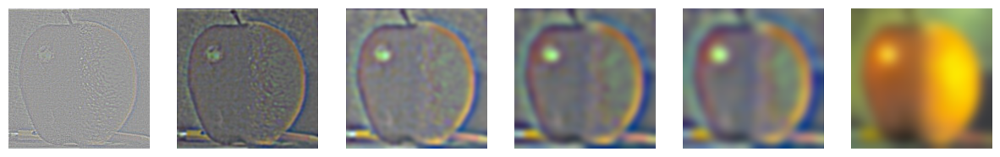

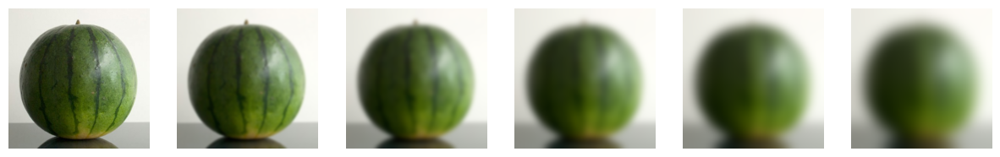

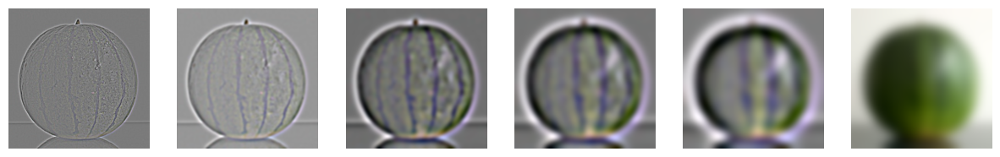

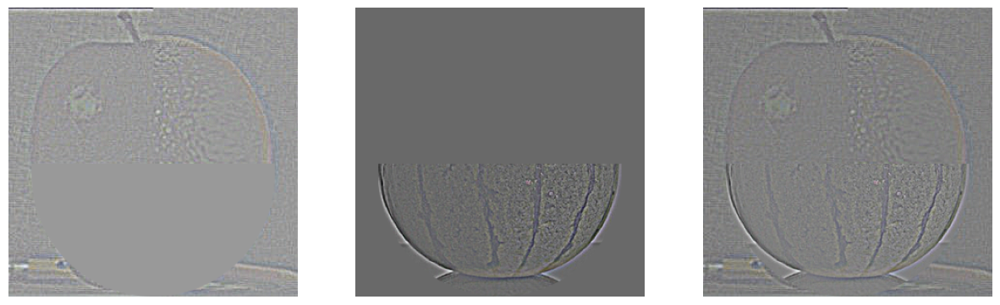

...

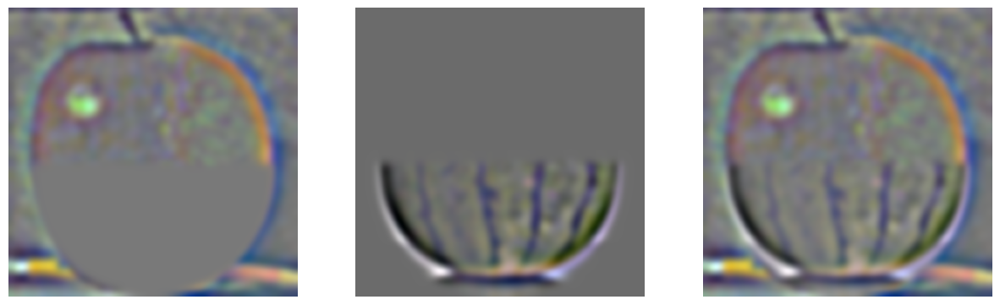

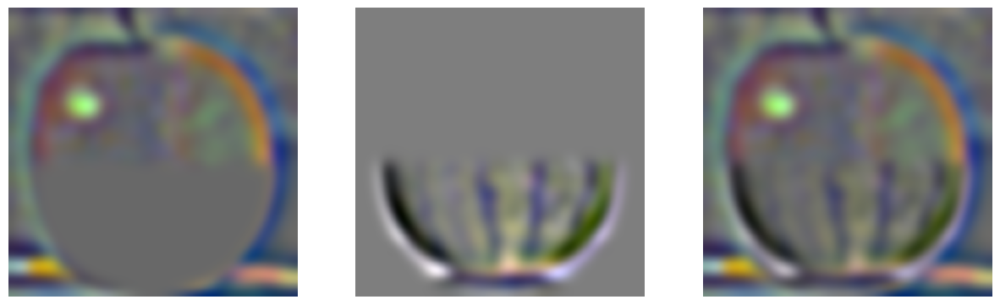

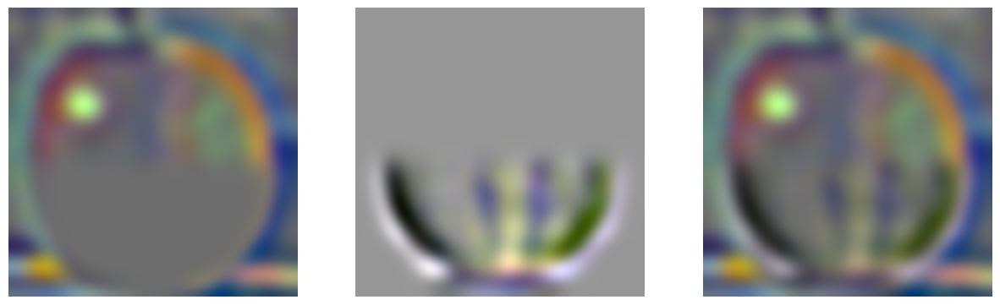

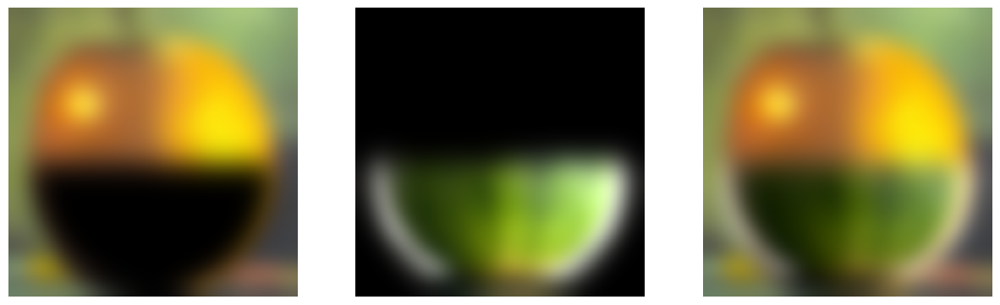

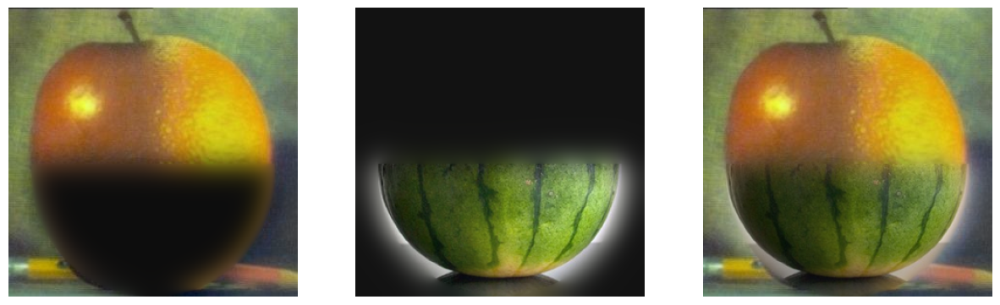

In [33]:
# Lets do it with with a lot of detail using the laplacian stack
oranapple = cv2.imread('data/oranapple.jpg')
oranapple = cv2.cvtColor(oranapple, cv2.COLOR_BGR2RGB)/ 255.0
oranapple_stack_gau = get_stacked_gau(oranapple)

show_images(oranapple_stack_gau)

# Lets do the Laplacian Stack now
oranapple_stack_lap = get_stacked_lap(oranapple_stack_gau)

show_images(oranapple_stack_lap)

watermelon = cv2.imread('data/watermelon.jpg')
watermelon = cv2.cvtColor(watermelon, cv2.COLOR_BGR2RGB)/ 255.0
watermelon_stack_gau = get_stacked_gau(watermelon)

show_images(watermelon_stack_gau)

# Lets do the Lapclacian Stack now
watermelon_stack_lap = get_stacked_lap(watermelon_stack_gau)

show_images(watermelon_stack_lap)

left_arr = []
right_arr = []
final_arr = []
for i in range(6):
    temp = []
    left = oranapple_stack_lap[i] * round_half_mask_stack_gau[i]
    right = watermelon_stack_lap[i] * (1 - round_half_mask_stack_gau[i])
    temp_final = left + right
    left_arr.append(left)
    right_arr.append(right)
    final_arr.append(temp_final)
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(normalized_image(left))
    axs[1].imshow(normalized_image(right))
    axs[2].imshow(normalized_image(temp_final))
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    plt.show()

final_left = 0
final_right = 0
final = 0

for i in range(6):
    final_left += left_arr[i]
    final_right += right_arr[i]
    final += final_arr[i]

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(normalized_image(final_left))
axs[1].imshow(normalized_image(final_right))
axs[2].imshow(normalized_image(final))
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')

plt.show()


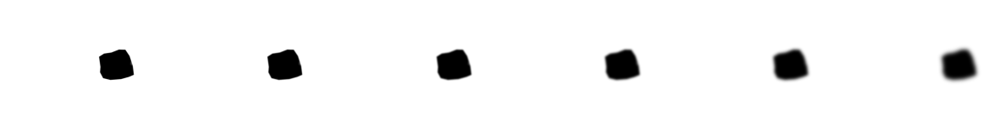

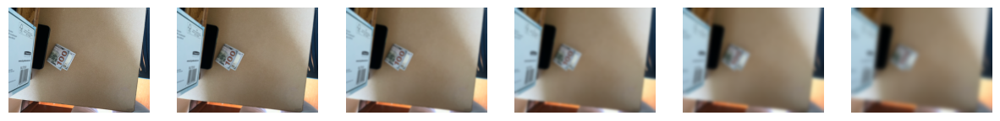

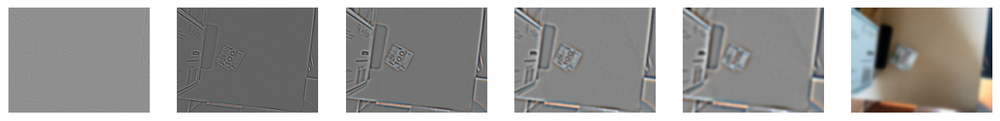

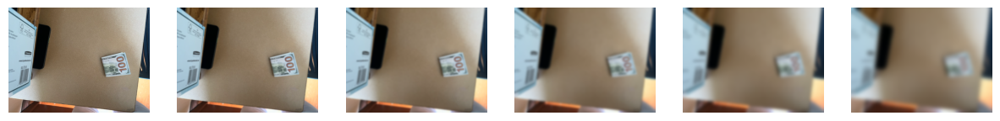

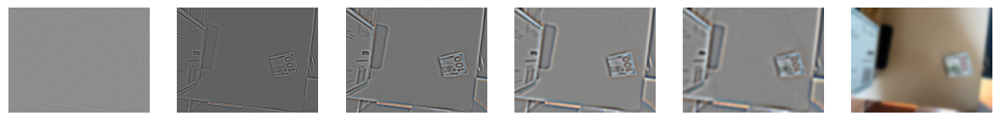

...

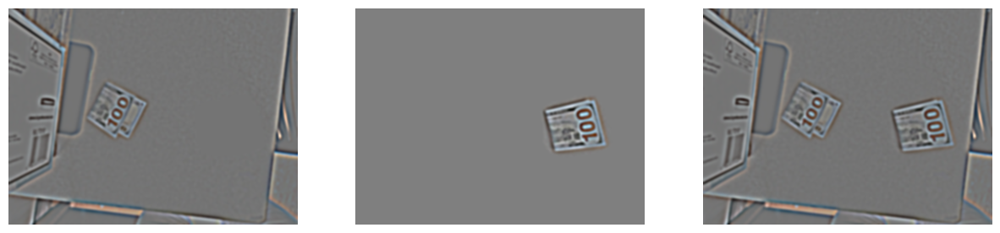

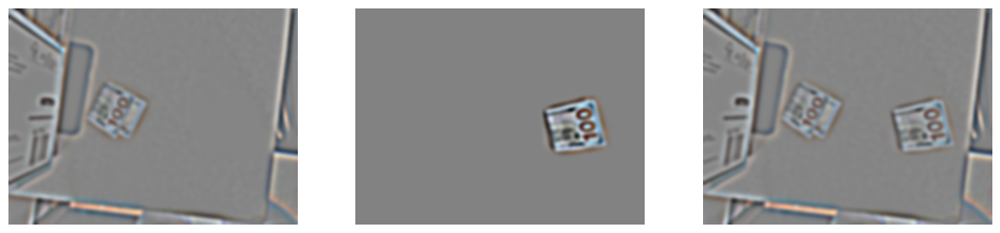

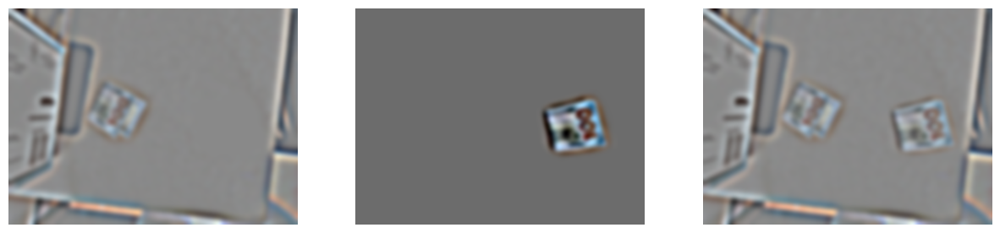

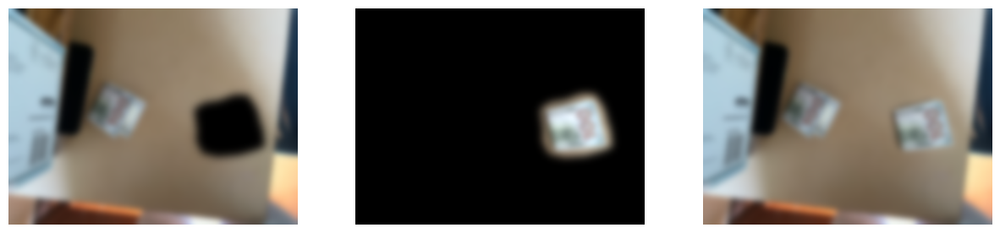

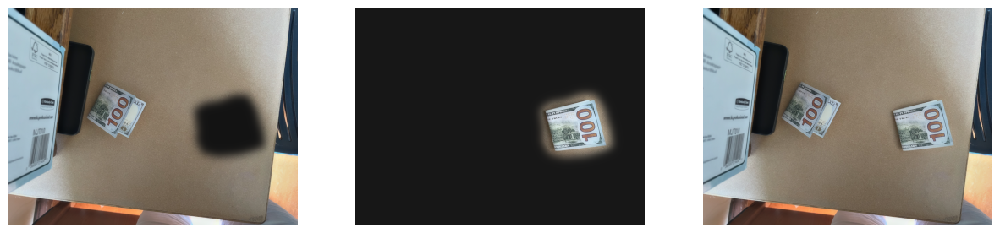

In [34]:
# Now we try it with our irregular mask that is a half circle
half_mask_round = cv2.imread('data/moneymask.png')[:, :, 0] / 255.0
round_half_mask_stack_gau = []
round_half_mask_stack_gau.append(half_mask_round)

# We are doing 6 layers for our stack, so we need to do 5 more
for i in range(5):
    # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
    sigma = (i + 1) * 2
    # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
    kernelsize = sigma * 6 + 1
    gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
    # We need to choose symm for boundary here because else we get like a weird black border around the white part
    blurry_image_half_mask = scipy.signal.convolve2d(round_half_mask_stack_gau[i], gaussian_kernel, mode='same', boundary='symm')
    round_half_mask_stack_gau.append(blurry_image_half_mask)

# Show the images
fig, axs = plt.subplots(1, 6, figsize=(15, 5)) 
for i in range(6):
    axs[i].imshow(round_half_mask_stack_gau[i], cmap='gray') 
    axs[i].axis('off') 
    # A lazy hack so that I can just multiply the mask with the image later
    round_half_mask_stack_gau[i] = np.stack([round_half_mask_stack_gau[i]] * 3, axis=-1)
plt.show()

# Lets do it with with a lot of detail using the laplacian stack
oranapple = cv2.imread('data/money_left.png')
oranapple = cv2.cvtColor(oranapple, cv2.COLOR_BGR2RGB)/ 255.0
oranapple_stack_gau = get_stacked_gau(oranapple)

show_images(oranapple_stack_gau)

# Lets do the Laplacian Stack now
oranapple_stack_lap = get_stacked_lap(oranapple_stack_gau)

show_images(oranapple_stack_lap)

watermelon = cv2.imread('data/money_right.png')
watermelon = cv2.cvtColor(watermelon, cv2.COLOR_BGR2RGB)/ 255.0
watermelon_stack_gau = get_stacked_gau(watermelon)

show_images(watermelon_stack_gau)

# Lets do the Lapclacian Stack now
watermelon_stack_lap = get_stacked_lap(watermelon_stack_gau)

show_images(watermelon_stack_lap)

left_arr = []
right_arr = []
final_arr = []
for i in range(6):
    temp = []
    left = oranapple_stack_lap[i] * round_half_mask_stack_gau[i]
    right = watermelon_stack_lap[i] * (1 - round_half_mask_stack_gau[i])
    temp_final = left + right
    left_arr.append(left)
    right_arr.append(right)
    final_arr.append(temp_final)
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(normalized_image(left))
    axs[1].imshow(normalized_image(right))
    axs[2].imshow(normalized_image(temp_final))
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    plt.show()

final_left = 0
final_right = 0
final = 0

for i in range(6):
    final_left += left_arr[i]
    final_right += right_arr[i]
    final += final_arr[i]

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(normalized_image(final_left))
axs[1].imshow(normalized_image(final_right))
axs[2].imshow(normalized_image(final))
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')

plt.show()


In [35]:
plt.imsave('2_moneys_final.jpg', normalized_image(final))


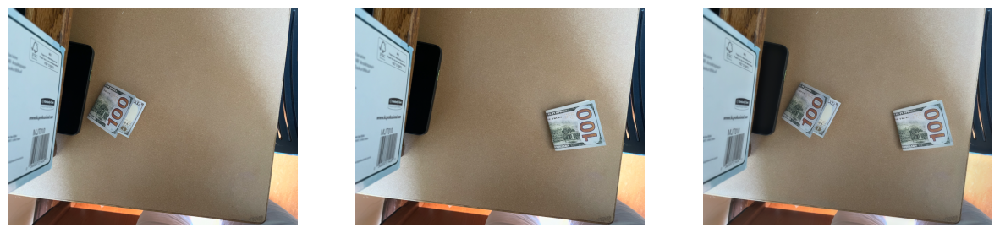

In [36]:
show_images([normalized_image(oranapple), normalized_image(watermelon), normalized_image(final)])
